In [1]:
# ---------------------------------------------------------------
# Cell 1: Imports and environment setup
# ---------------------------------------------------------------

import os                # File and directory operations
import random            # Random number generation for reproducibility
import numpy as np       # Numerical computations
import pandas as pd      # Structured data handling
import matplotlib.pyplot as plt  # Data visualisation
import seaborn as sns    # Statistical visualisation
from tqdm import tqdm    # Progress bar for long-running loops
from glob import glob    # File pattern matching
import joblib            # Model and object persistence
import json              # Metadata and configuration storage
import cv2               # Image processing utilities
from PIL import Image    # Image loading and manipulation


In [2]:
# ---------------------------------------------------------------
# Cell 2: Machine Learning library imports
# ---------------------------------------------------------------

import sklearn   # Core scikit-learn package

# Utilities for dataset splitting and cross-validation
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV

# Feature scaling and multi-class label processing
from sklearn.preprocessing import StandardScaler, label_binarize

# Classical machine learning models
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

# Evaluation metrics for classification performance
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    accuracy_score,
    f1_score,
    roc_auc_score
)

# Probability calibration for classifiers
from sklearn.calibration import CalibratedClassifierCV

import os   # Operating system interactions


In [3]:
# ---------------------------------------------------------------
# Cell 3: Deep learning libraries (TensorFlow / Keras)
# ---------------------------------------------------------------

import tensorflow as tf   # Core deep learning framework

# Pre-trained MobileNetV2 model for transfer learning
from tensorflow.keras.applications import MobileNetV2

# Input preprocessing aligned with MobileNetV2 training
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

# Image loading and conversion utilities
from tensorflow.keras.preprocessing import image as kimage

# Neural network model and layer abstractions
from tensorflow.keras import models, layers


In [4]:
# ---------------------------------------------------------------
# Cell 4: Reproducibility configuration
# ---------------------------------------------------------------

# Fixed random seed to ensure reproducible results
SEED = 42

# Control randomness across Python, NumPy, and TensorFlow
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)


In [5]:
# ---------------------------------------------------------------
# Cell 5: Dataset paths and configuration
# ---------------------------------------------------------------

import os

# Root directory containing the disaster image dataset
DATA_ROOT = r"D:\DisasterModel"

# Directory for caching extracted deep feature embeddings
EMBEDDINGS_DIR = "embeddings_cache"
os.makedirs(EMBEDDINGS_DIR, exist_ok=True)

# Input image dimensions compatible with MobileNetV2
IMG_SIZE = (224, 224)

# Batch size for feature extraction and model inference
BATCH_SIZE = 32


In [6]:
# ---------------------------------------------------------------
# Cell 6: Dataset discovery and indexing
# ---------------------------------------------------------------


def discover_dataset(root):
    """
    Traverses a dataset directory organised into
    train / validation / test splits with class subfolders
    and returns a DataFrame of image paths and labels.
    """
    rows = []

    # Iterate through predefined dataset splits
    for split in ['train', 'validation', 'test']:
        split_dir = os.path.join(root, split)

        # Skip split if it does not exist
        if not os.path.isdir(split_dir):
            continue

        # Iterate through class directories within each split
        for cls in sorted(os.listdir(split_dir)):
            cls_dir = os.path.join(split_dir, cls)

            if not os.path.isdir(cls_dir):
                continue

            # Collect all image file paths for the class
            for img in glob(os.path.join(cls_dir, "*")):
                rows.append({
                    'path': img,
                    'label': cls
                })

    # Return structured dataset as a DataFrame
    return pd.DataFrame(rows)


# Execute dataset discovery
df_all = discover_dataset(DATA_ROOT)

# Display total number of discovered images
print("Discovered images:", len(df_all))


Discovered images: 2400


In [7]:
# ---------------------------------------------------------------
# Cell 7: Label sanitisation and image format filtering
# ---------------------------------------------------------------

# Ensure labels are treated consistently as strings
df_all['label'] = df_all['label'].astype(str)

# Extract file extensions to identify valid image formats
df_all['ext'] = df_all['path'].apply(
    lambda p: os.path.splitext(p)[1].lower()
)

# Retain only supported image formats and reset indexing
df_all = df_all[
    df_all['ext'].isin(['.jpg', '.jpeg', '.png', '.bmp'])
].reset_index(drop=True)

# Confirm dataset size after filtering
print("After filtering valid image formats:", len(df_all))


After filtering valid image formats: 2400


Classes: ['cyclone', 'earthquake', 'flood', 'wildfire']
label
cyclone       600
earthquake    600
flood         600
wildfire      600
Name: count, dtype: int64


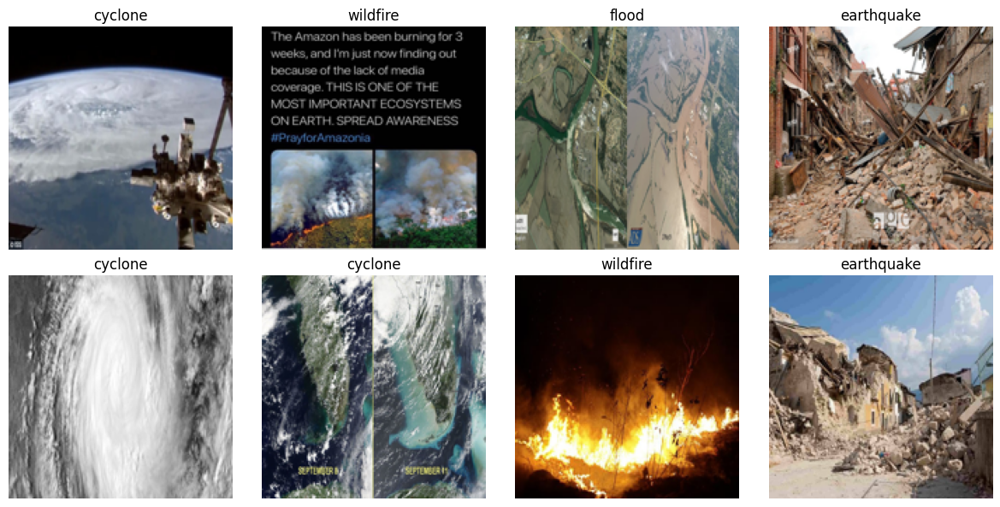

In [8]:
# ---------------------------------------------------------------
# Cell 8: Dataset exploration and sample visualisation
# ---------------------------------------------------------------

# Display unique class labels present in the dataset
print("Classes:", sorted(df_all['label'].unique()))

# Display the distribution of images across classes
print(df_all['label'].value_counts())

# Create a grid layout for visual inspection of sample images
fig, axes = plt.subplots(2, 4, figsize=(12, 6))

# Randomly sample images to qualitatively assess dataset diversity
for ax, (_, row) in zip(
    axes.flatten(),
    df_all.sample(8, random_state=SEED).iterrows()
):
    img = Image.open(row['path']).convert('RGB').resize((160, 160))
    ax.imshow(img)
    ax.set_title(row['label'])
    ax.axis('off')

# Adjust layout for clear visual presentation
plt.tight_layout()


In [9]:
# ---------------------------------------------------------------
# Cell 9: Train / validation / test split strategy
# ---------------------------------------------------------------

# Determine whether dataset paths already contain predefined splits
# (train / validation / test) to avoid unnecessary resplitting
def paths_contain_split(df, split_name):
    target = os.path.join(DATA_ROOT, split_name)
    return df['path'].str.contains(target).any()

# Use folder-based splits if available
if paths_contain_split(df_all, 'train'):
    train_df = df_all[
        df_all['path'].str.contains(os.path.join(DATA_ROOT, 'train'))
    ].reset_index(drop=True)

    val_df = df_all[
        df_all['path'].str.contains(os.path.join(DATA_ROOT, 'validation'))
    ].reset_index(drop=True)

    test_df = df_all[
        df_all['path'].str.contains(os.path.join(DATA_ROOT, 'test'))
    ].reset_index(drop=True)

    print("Using folder-based dataset splits.")

# Otherwise, perform stratified random splitting
else:
    print("Folder-based splits not found — performing stratified random split.")

    # Maintain class distribution across splits
    train_df, temp_df = train_test_split(
        df_all,
        test_size=0.25,
        stratify=df_all['label'],
        random_state=SEED
    )

    val_df, test_df = train_test_split(
        temp_df,
        test_size=0.5,
        stratify=temp_df['label'],
        random_state=SEED
    )

    # Save splits for reproducibility
    train_df.to_csv("split_train.csv", index=False)
    val_df.to_csv("split_val.csv", index=False)
    test_df.to_csv("split_test.csv", index=False)

# Report final dataset sizes
print("Train / Val / Test sizes:", len(train_df), len(val_df), len(test_df))


Folder-based splits not found — performing stratified random split.
Train / Val / Test sizes: 1800 300 300


In [10]:
# ---------------------------------------------------------------
# Cell 10: Deep Feature Extraction with MobileNetV2
# ---------------------------------------------------------------

# Initialise a pre-trained MobileNetV2 model as a fixed feature extractor.
# The classification head is removed and global average pooling is applied
# to obtain compact, high-level visual embeddings.
base_model = MobileNetV2(
    weights='imagenet',
    include_top=False,
    pooling='avg',
    input_shape=IMG_SIZE + (3,)
)

# Freeze all layers to prevent weight updates during feature extraction
base_model.trainable = False


def preprocess_and_extract(path):
    """
    Loads an image from disk, applies MobileNetV2 preprocessing,
    and extracts a flattened deep feature embedding.
    """
    img = kimage.load_img(path, target_size=IMG_SIZE)
    x = kimage.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)

    # Forward pass through frozen CNN to obtain embedding
    emb = base_model.predict(x, verbose=0)
    return emb.flatten()


def compute_embeddings(df, cache_name):
    """
    Computes deep feature embeddings for a dataset split.
    Embeddings are cached to disk to avoid repeated computation
    and improve experimental efficiency and reproducibility.
    """
    cache_path = os.path.join(EMBEDDINGS_DIR, cache_name)

    # Load cached embeddings if they already exist
    if os.path.exists(cache_path):
        print("Loading cached embeddings:", cache_path)
        data = np.load(cache_path, allow_pickle=True)
        return data['X'], data['y'].tolist()

    # Otherwise, extract embeddings from scratch
    X_list, y_list = [], []
    for p, lbl in tqdm(zip(df['path'], df['label']), total=len(df)):
        emb = preprocess_and_extract(p)
        X_list.append(emb)
        y_list.append(lbl)

    # Stack embeddings and persist to disk for future reuse
    X = np.vstack(X_list)
    np.savez(cache_path, X=X, y=np.array(y_list))
    print("Saved cache to", cache_path)

    return X, y_list


# Compute (or load) embeddings for train, validation, and test splits
X_train, y_train = compute_embeddings(train_df, "emb_train.npz")
X_val,   y_val   = compute_embeddings(val_df,   "emb_val.npz")
X_test,  y_test  = compute_embeddings(test_df,  "emb_test.npz")

# Verify dimensional consistency across all splits
print(
    "Shapes:",
    X_train.shape, len(y_train),
    X_val.shape,   len(y_val),
    X_test.shape,  len(y_test)
)


Loading cached embeddings: embeddings_cache\emb_train.npz
Loading cached embeddings: embeddings_cache\emb_val.npz
Loading cached embeddings: embeddings_cache\emb_test.npz
Shapes: (1800, 1280) 1800 (300, 1280) 300 (300, 1280) 300


In [11]:
# ---------------------------------------------------------------
# Cell 11: Label Encoding and Feature Scaling
# ---------------------------------------------------------------

# Encode string class labels into numerical form
# using a single encoder fitted across all dataset splits
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
le.fit(y_train + y_val + y_test)

# Transform labels for each split
y_train_enc = le.transform(y_train)
y_val_enc   = le.transform(y_val)
y_test_enc  = le.transform(y_test)

# Store class names and total number of classes
class_names = le.classes_.tolist()
NUM_CLASSES = len(class_names)
print("Classes:", class_names)

# Standardise deep feature embeddings to zero mean and unit variance
# to improve optimisation stability for distance-based classifiers
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled   = scaler.transform(X_val)
X_test_scaled  = scaler.transform(X_test)

# Persist preprocessing objects for reproducibility and deployment
joblib.dump(le, "label_encoder.joblib")
joblib.dump(scaler, "scaler.joblib")


Classes: ['cyclone', 'earthquake', 'flood', 'wildfire']


['scaler.joblib']

In [12]:
# ---------------------------------------------------------------
# Cell 12: Support Vector Machine (SVM) with Hyperparameter Optimisation
# ---------------------------------------------------------------

# Initialise SVM classifier with probability estimates
# and balanced class weights to address class imbalance
svc = SVC(
    probability=True,
    class_weight='balanced',
    random_state=SEED
)

# Define hyperparameter search space for model optimisation
param_grid = {
    'C': [0.1, 1, 10],               # regularisation strength
    'kernel': ['rbf', 'linear'],     # kernel functions
    'gamma': ['scale', 'auto']       # kernel coefficient
}

# Stratified k-fold cross-validation to preserve class distribution
cv = StratifiedKFold(
    n_splits=5,
    shuffle=True,
    random_state=SEED
)

# Perform exhaustive grid search using macro F1-score
# to ensure balanced performance across all classes
grid = GridSearchCV(
    estimator=svc,
    param_grid=param_grid,
    cv=cv,
    scoring='f1_macro',
    n_jobs=-1,
    verbose=2
)

# Train SVM model and identify optimal hyperparameters
grid.fit(X_train_scaled, y_train_enc)

# Retrieve and save the best-performing SVM model
print("Best params:", grid.best_params_)
best_svc = grid.best_estimator_
joblib.dump(best_svc, "best_svc.joblib")


Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best params: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}


['best_svc.joblib']

=== Validation - SVM Classification Report of SVM ===
              precision    recall  f1-score   support

     cyclone     1.0000    1.0000    1.0000        75
  earthquake     0.9481    0.9733    0.9605        75
       flood     0.9595    0.9467    0.9530        75
    wildfire     1.0000    0.9867    0.9933        75

    accuracy                         0.9767       300
   macro avg     0.9769    0.9767    0.9767       300
weighted avg     0.9769    0.9767    0.9767       300

Validation - SVM Accuracy = 0.9767
Validation - SVM Macro F1-score = 0.9767


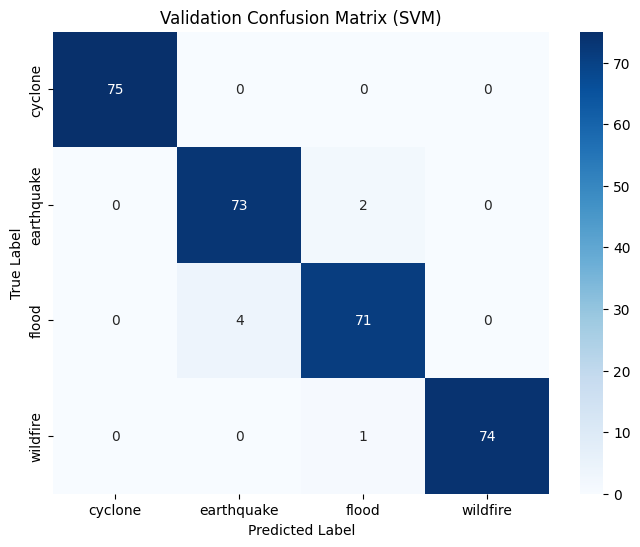

=== Test - SVM Classification Report of SVM ===
              precision    recall  f1-score   support

     cyclone     0.9737    0.9867    0.9801        75
  earthquake     0.9868    1.0000    0.9934        75
       flood     0.9730    0.9600    0.9664        75
    wildfire     0.9865    0.9733    0.9799        75

    accuracy                         0.9800       300
   macro avg     0.9800    0.9800    0.9800       300
weighted avg     0.9800    0.9800    0.9800       300

Test - SVM Accuracy = 0.9800
Test - SVM Macro F1-score = 0.9800


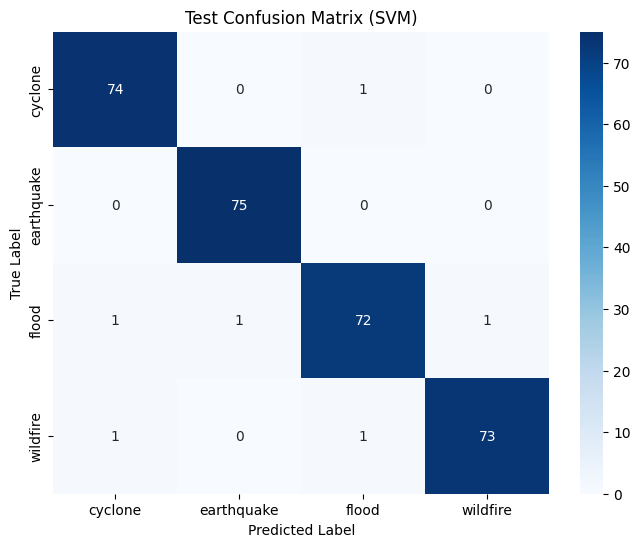

In [ ]:
# ---------------------------------------------------------------
# Cell 13: Model Evaluation Utilities of SVM
# ---------------------------------------------------------------

def evaluate_model(model, Xs, ys_enc, split_name="val"):
    """
    Evaluates a trained classifier on a given dataset split
    and reports standard classification metrics.
    """

    # Generate predicted class labels
    y_pred = model.predict(Xs)

    # Obtain class probability estimates if supported
    probs = model.predict_proba(Xs) if hasattr(model, "predict_proba") else None

    # Display detailed classification report
    print(f"=== {split_name} Classification Report of SVM ===")
    print(
        classification_report(
            ys_enc,
            y_pred,
            target_names=class_names,
            digits=4
        )
    )

    # Compute confusion matrix and summary metrics
    cm = confusion_matrix(ys_enc, y_pred)
    acc = accuracy_score(ys_enc, y_pred)
    macro_f1 = f1_score(ys_enc, y_pred, average='macro')

    # Print aggregate performance indicators
    print(f"{split_name} Accuracy = {acc:.4f}")
    print(f"{split_name} Macro F1-score = {macro_f1:.4f}")

    return (
        classification_report(
            ys_enc,
            y_pred,
            target_names=class_names,
            digits=4,
            output_dict=True
        ),
        cm,
        probs
    )



# ---------------------------------------------------------------
# Validation set evaluation
# ---------------------------------------------------------------
val_report, val_cm, val_probs = evaluate_model(
    best_svc, X_val_scaled, y_val_enc, "Validation - SVM"
)

# Plot Validation Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(
    val_cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=class_names,
    yticklabels=class_names
)
plt.title("Validation Confusion Matrix (SVM)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()


# ---------------------------------------------------------------
# Test set evaluation (FINAL evaluation)
# ---------------------------------------------------------------
test_report, test_cm, test_probs = evaluate_model(
    best_svc, X_test_scaled, y_test_enc, "Test - SVM"
)

# Plot Test Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(
    test_cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=class_names,
    yticklabels=class_names
)
plt.title("Test Confusion Matrix (SVM)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()


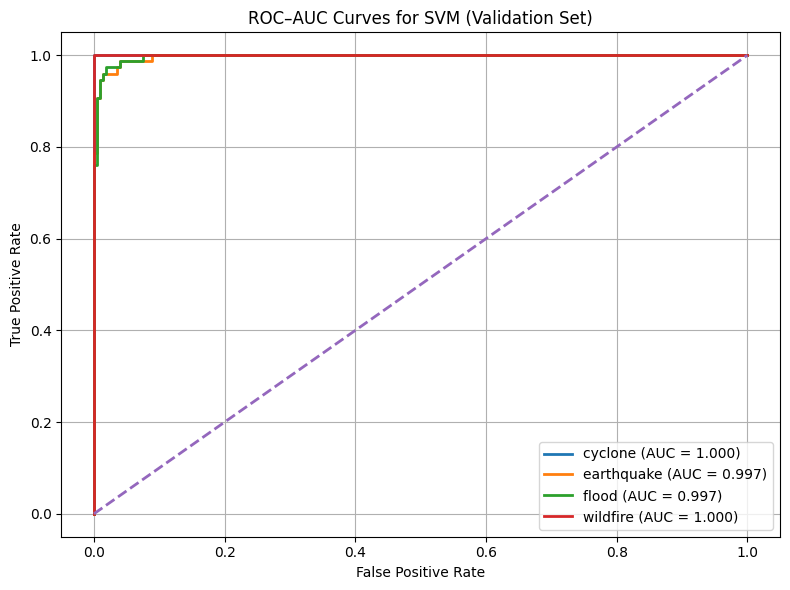

In [ ]:
# ---------------------------------------------------------------
# Cell 14: ROC–AUC Curves for SVM (Validation Set)
# ---------------------------------------------------------------

# Plots one-vs-rest ROC–AUC curves for each disaster class
# using validation set probabilities from the trained SVM.
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np


# Binarise true labels for multi-class ROC computation
# Converts class labels into one-hot encoded format
y_val_bin = label_binarize(y_val_enc, classes=np.arange(len(class_names)))


# Compute ROC curve and AUC for each class
plt.figure(figsize=(8, 6))

for i, class_name in enumerate(class_names):
    # False Positive Rate, True Positive Rate
    fpr, tpr, _ = roc_curve(y_val_bin[:, i], val_probs[:, i])
    
    # Area Under Curve
    roc_auc = auc(fpr, tpr)
    
    # Plot ROC curve
    plt.plot(
        fpr,
        tpr,
        lw=2,
        label=f"{class_name} (AUC = {roc_auc:.3f})"
    )


# Plot reference diagonal (random classifier)
plt.plot([0, 1], [0, 1], linestyle="--", linewidth=2)


# Plot formatting
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC–AUC Curves for SVM (Validation Set)")
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()


Fitting 5 folds for each of 8 candidates, totalling 40 fits


d:\Disaster_AI\venv\Lib\site-packages\xgboost\training.py:199: UserWarning: [21:15:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Best XGBoost hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 250}
=== Validation - XGBoost Classification Report of SVM ===
              precision    recall  f1-score   support

     cyclone     0.9868    1.0000    0.9934        75
  earthquake     0.9221    0.9467    0.9342        75
       flood     0.9583    0.9200    0.9388        75
    wildfire     1.0000    1.0000    1.0000        75

    accuracy                         0.9667       300
   macro avg     0.9668    0.9667    0.9666       300
weighted avg     0.9668    0.9667    0.9666       300

Validation - XGBoost Accuracy = 0.9667
Validation - XGBoost Macro F1-score = 0.9666


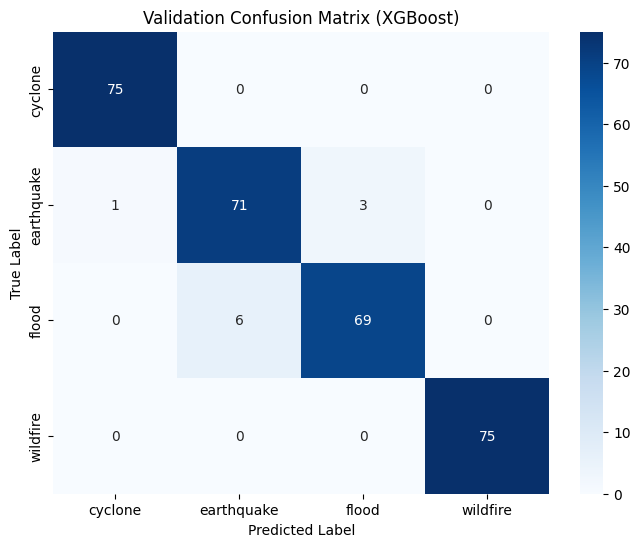

=== Test - XGBoost Classification Report of SVM ===
              precision    recall  f1-score   support

     cyclone     0.9861    0.9467    0.9660        75
  earthquake     0.9467    0.9467    0.9467        75
       flood     0.9730    0.9600    0.9664        75
    wildfire     0.9241    0.9733    0.9481        75

    accuracy                         0.9567       300
   macro avg     0.9575    0.9567    0.9568       300
weighted avg     0.9575    0.9567    0.9568       300

Test - XGBoost Accuracy = 0.9567
Test - XGBoost Macro F1-score = 0.9568


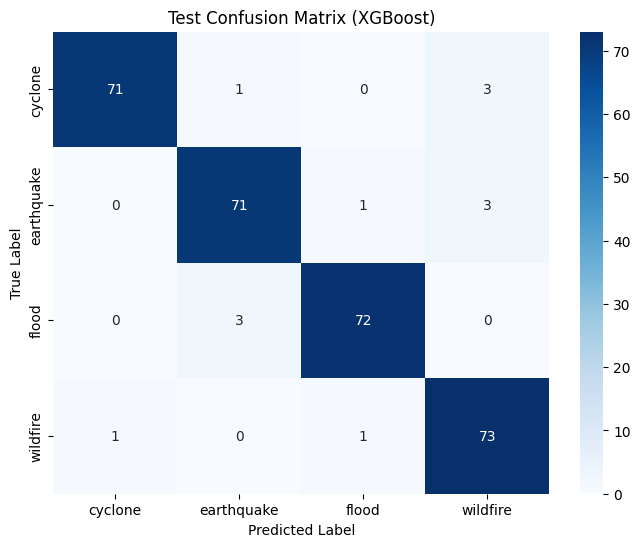

In [ ]:
# ---------------------------------------------------------------
# Cell 14: Optional XGBoost Classifier (Ensemble Learning)
# ---------------------------------------------------------------

try:
    # Import XGBoost only if available in the environment
    from xgboost import XGBClassifier

    
    # Initialise XGBoost multi-class classifier
    xgb = XGBClassifier(
        use_label_encoder=False,
        eval_metric='mlogloss',
        random_state=SEED
    )


    # Define hyperparameter search space
    xgb_params = {
        'n_estimators': [100, 250],
        'max_depth': [3, 6],
        'learning_rate': [0.1, 0.01]
    }

    
    # Stratified cross-validation grid search
    grid_xgb = GridSearchCV(
        estimator=xgb,
        param_grid=xgb_params,
        cv=cv,
        scoring='f1_macro',
        n_jobs=-1,
        verbose=1
    )

    # Train and tune XGBoost model
    grid_xgb.fit(X_train_scaled, y_train_enc)

    # Extract best-performing model
    best_xgb = grid_xgb.best_estimator_
    print("Best XGBoost hyperparameters:", grid_xgb.best_params_)

    # Persist trained model for reproducibility
    joblib.dump(best_xgb, "best_xgb.joblib")


    # -----------------------------------------------------------
    # Validation set evaluation
    # -----------------------------------------------------------
    val_report_xgb, val_cm_xgb, val_probs_xgb = evaluate_model(
        best_xgb,
        X_val_scaled,
        y_val_enc,
        split_name="Validation - XGBoost"
    )

    # Plot Validation Confusion Matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(
        val_cm_xgb,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=class_names,
        yticklabels=class_names
    )
    plt.title("Validation Confusion Matrix (XGBoost)")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.show()

    # -----------------------------------------------------------
    # Test set evaluation
    # -----------------------------------------------------------
    test_report_xgb, test_cm_xgb, test_probs_xgb = evaluate_model(
        best_xgb,
        X_test_scaled,
        y_test_enc,
        split_name="Test - XGBoost"
    )

    # Plot Test Confusion Matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(
        test_cm_xgb,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=class_names,
        yticklabels=class_names
    )
    plt.title("Test Confusion Matrix (XGBoost)")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.show()

except Exception as e:
    # Graceful handling if XGBoost is not installed
    print("XGBoost unavailable in this environment:", e)


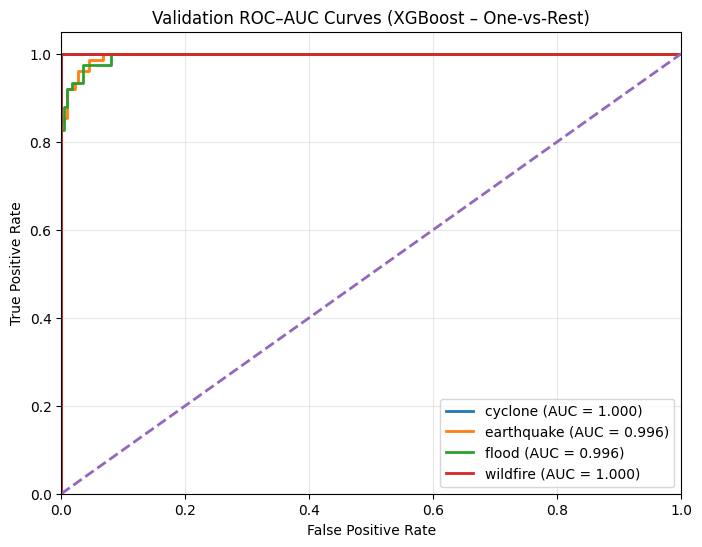

In [ ]:
# ---------------------------------------------------------------
# Cell 15: ROC–AUC Curves (Validation Set – XGBoost)
# ---------------------------------------------------------------

# Plots one-vs-rest ROC–AUC curves for each disaster class
# using validation set predictions from the trained XGBoost model.

from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np

# ---------------------------------------------------------------
# Binarise true validation labels for one-vs-rest ROC computation
# ---------------------------------------------------------------
# Converts class labels into binary format required for multi-class ROC
y_val_bin = label_binarize(
    y_val_enc,
    classes=np.arange(len(class_names))
)

# Number of disaster classes
n_classes = y_val_bin.shape[1]

# ---------------------------------------------------------------
# Plot ROC–AUC curve for each class
# ---------------------------------------------------------------
plt.figure(figsize=(8, 6))

for i in range(n_classes):
    # Compute False Positive Rate and True Positive Rate
    fpr, tpr, _ = roc_curve(y_val_bin[:, i], val_probs_xgb[:, i])
    
    # Compute Area Under Curve (AUC)
    roc_auc = auc(fpr, tpr)

    # Plot ROC curve for current class
    plt.plot(
        fpr,
        tpr,
        lw=2,
        label=f"{class_names[i]} (AUC = {roc_auc:.3f})"
    )

# ---------------------------------------------------------------
# Plot reference line for random classifier
# ---------------------------------------------------------------
plt.plot([0, 1], [0, 1], linestyle='--', lw=2)

# ---------------------------------------------------------------
# Plot formatting
# ---------------------------------------------------------------
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Validation ROC–AUC Curves (XGBoost – One-vs-Rest)")
plt.legend(loc="lower right")
plt.grid(alpha=0.3)
plt.show()


In [17]:
# ---------------------------------------------------------------
# Cell 16: Neural Network (MLP) using MobileNetV2 Embeddings
# ---------------------------------------------------------------
# Implements a deep Multi-Layer Perceptron classifier trained on
# fixed MobileNetV2 feature embeddings for multi-class disaster
# image classification.

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Number of target classes inferred from label encoder
NUM_CLASSES = len(class_names)

# ---------------------------------------------------------------
# Model architecture definition
# ---------------------------------------------------------------
# Fully connected MLP with progressive dimensionality reduction,
# batch normalisation for training stability, and dropout for
# regularisation to mitigate overfitting.
model = Sequential([

    # High-capacity input layer to learn complex feature interactions
    Dense(512, activation='relu', input_shape=(X_train_scaled.shape[1],)),
    BatchNormalization(),
    Dropout(0.5),

    # Intermediate hidden layer for hierarchical feature abstraction
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.4),

    # Compact representation before classification
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    # Output layer with softmax for multi-class probability estimation
    Dense(NUM_CLASSES, activation='softmax')
])

# ---------------------------------------------------------------
# Model compilation
# ---------------------------------------------------------------
# Adam optimiser enables adaptive learning rates,
# while sparse categorical loss supports integer-encoded labels.
model.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Display model structure for transparency and reporting
model.summary()

# ---------------------------------------------------------------
# Training callbacks
# ---------------------------------------------------------------
# Early stopping prevents overfitting by restoring the best model,
# while learning-rate reduction improves convergence near minima.
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=6,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.3,
    patience=3,
    min_lr=1e-6
)

# ---------------------------------------------------------------
# Model training
# ---------------------------------------------------------------
# Train using scaled MobileNetV2 embeddings with validation monitoring
history = model.fit(
    X_train_scaled,
    y_train_enc,
    validation_data=(X_val_scaled, y_val_enc),
    epochs=50,
    batch_size=32,
    callbacks=[early_stop, reduce_lr],
    verbose=1
)

# ---------------------------------------------------------------
# Persist trained model
# ---------------------------------------------------------------
# Save final neural network for reproducibility and future inference
model.save("best_nn_model.keras")
print("Neural Network model trained and saved successfully.")


d:\Disaster_AI\venv\Lib\site-packages\keras\src\layers\core\dense.py:95: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 824,196 (3.14 MB)

 Trainable params: 822,404 (3.14 MB)

 Non-trainable params: 1,792 (7.00 KB)

Epoch 1/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - accuracy: 0.8211 - loss: 0.4968 - val_accuracy: 0.9733 - val_loss: 0.0849 - learning_rate: 0.0010
Epoch 2/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.9500 - loss: 0.1524 - val_accuracy: 0.9700 - val_loss: 0.1015 - learning_rate: 0.0010
Epoch 3/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.9639 - loss: 0.1015 - val_accuracy: 0.9767 - val_loss: 0.0912 - learning_rate: 0.0010
Epoch 4/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.9822 - loss: 0.0605 - val_accuracy: 0.9767 - val_loss: 0.0841 - learning_rate: 0.0010
Epoch 5/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.9806 - loss: 0.0478 - val_accuracy: 0.9800 - val_loss: 0.0881 - learning_rate: 0.0010
Epoch 6/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.9844 - loss: 0.0383 - val_accuracy: 0.9800 - val_loss: 0.0943 - learning_rate: 0.0010
Epoch 7/50
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.9911 - loss: 0.0269 - val_acc

In [18]:
# ---------------------------------------------------------------
# Cell 17: Neural Network Evaluation
# ---------------------------------------------------------------
# Evaluates the trained MLP model on validation and test datasets
# using standard classification metrics to assess generalisation
# performance and class-wise predictive behaviour.

from sklearn.metrics import classification_report, accuracy_score, f1_score
import numpy as np

# ---------------------------------------------------------------
# Generate class probability predictions
# ---------------------------------------------------------------
# Softmax outputs represent confidence scores for each disaster class
val_probs_nn  = model.predict(X_val_scaled)
test_probs_nn = model.predict(X_test_scaled)

# ---------------------------------------------------------------
# Convert probabilities to predicted class labels
# ---------------------------------------------------------------
# Selects the class with the highest posterior probability
val_pred_nn  = np.argmax(val_probs_nn, axis=1)
test_pred_nn = np.argmax(test_probs_nn, axis=1)

# ---------------------------------------------------------------
# Validation performance analysis
# ---------------------------------------------------------------
# Provides precision, recall, F1-score, and support per class
print("=== Validation - Neural Network ===")
print(
    classification_report(
        y_val_enc,
        val_pred_nn,
        target_names=class_names,
        digits=4
    )
)

# Aggregate validation metrics
print("Val acc:", accuracy_score(y_val_enc, val_pred_nn))
print("Val macro F1:", f1_score(y_val_enc, val_pred_nn, average="macro"))

# ---------------------------------------------------------------
# Test performance analysis
# ---------------------------------------------------------------
# Final unbiased evaluation on unseen data
print("\n=== Test - Neural Network ===")
print(
    classification_report(
        y_test_enc,
        test_pred_nn,
        target_names=class_names,
        digits=4
    )
)

# Aggregate test metrics
print("Test acc:", accuracy_score(y_test_enc, test_pred_nn))
print("Test macro F1:", f1_score(y_test_enc, test_pred_nn, average="macro"))


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
=== Validation - Neural Network ===
              precision    recall  f1-score   support

     cyclone     1.0000    0.9867    0.9933        75
  earthquake     0.9733    0.9733    0.9733        75
       flood     0.9605    0.9733    0.9669        75
    wildfire     0.9867    0.9867    0.9867        75

    accuracy                         0.9800       300
   macro avg     0.9801    0.9800    0.9800       300
weighted avg     0.9801    0.9800    0.9800       300

Val acc: 0.98
Val macro F1: 0.9800440019556426

=== Test - Neural Network ===
              precision    recall  f1-score   support

     cyclone     0.9867    0.9867    0.9867        75
  earthquake     0.9863    0.9600    0.9730        75
       flood     0.9730    0.9600    0.9664        75
    wildfire     0.9487    0.9867    0.9673        75

    accuracy                         0.9733       300
   macro avg     0.9737    0.9733    0.9734  

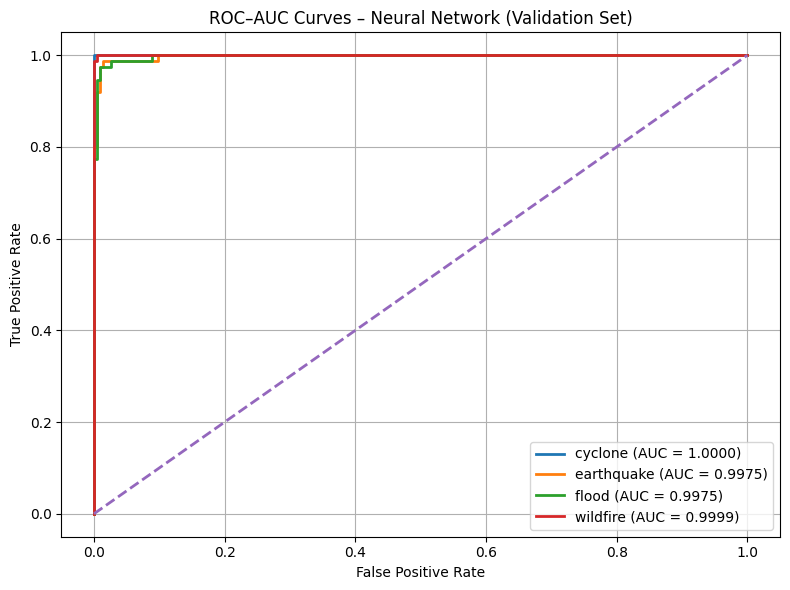

In [19]:
# ---------------------------------------------------------------
# Cell 18: ROC–AUC Curves (One-vs-Rest) – Neural Network (Validation)
# ---------------------------------------------------------------
# This cell plots one-vs-rest ROC–AUC curves for each disaster class
# using validation-set probability outputs from the trained Neural
# Network. ROC–AUC evaluates class-wise separability in a threshold-
# independent manner.

from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np

# ---------------------------------------------------------------
# Binarise validation labels for multi-class ROC computation
# ---------------------------------------------------------------
# Converts class labels into binary (one-vs-rest) format
y_val_bin = label_binarize(
    y_val_enc,
    classes=np.arange(len(class_names))
)

# ---------------------------------------------------------------
# Initialise ROC plot
# ---------------------------------------------------------------
plt.figure(figsize=(8, 6))

# ---------------------------------------------------------------
# Compute and plot ROC curve for each class
# ---------------------------------------------------------------
for i, class_name in enumerate(class_names):
    # Compute False Positive Rate (FPR) and True Positive Rate (TPR)
    fpr, tpr, _ = roc_curve(
        y_val_bin[:, i],
        val_probs_nn[:, i]   # probabilities from Cell 17
    )

    # Compute Area Under the Curve (AUC)
    roc_auc = auc(fpr, tpr)

    # Plot class-specific ROC curve
    plt.plot(
        fpr,
        tpr,
        lw=2,
        label=f"{class_name} (AUC = {roc_auc:.4f})"
    )

# ---------------------------------------------------------------
# Plot random classifier baseline
# ---------------------------------------------------------------
plt.plot([0, 1], [0, 1], linestyle='--', lw=2)

# ---------------------------------------------------------------
# Plot formatting
# ---------------------------------------------------------------
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC–AUC Curves – Neural Network (Validation Set)")
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()


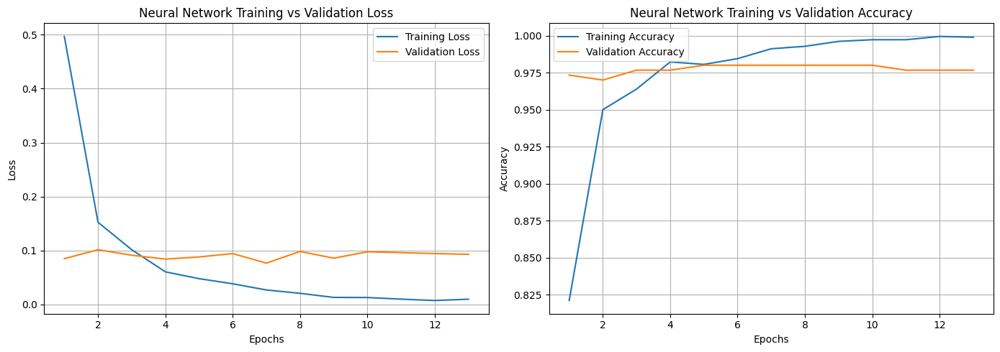

In [20]:
# ---------------------------------------------------------------
# Cell 19: Learning Curves (Neural Network)
# ---------------------------------------------------------------
# This cell visualises the learning behaviour of the Neural Network
# by plotting training and validation loss and accuracy over epochs.
# The curves are used to assess convergence, stability, and
# generalisation performance of the model.

import matplotlib.pyplot as plt

# ---------------------------------------------------------------
# Retrieve performance metrics recorded during model training
# ---------------------------------------------------------------
# These values are stored in the Keras History object after training
train_loss = history.history['loss']
val_loss   = history.history['val_loss']
train_acc  = history.history['accuracy']
val_acc    = history.history['val_accuracy']

# Define epoch range for x-axis
epochs_range = range(1, len(train_loss) + 1)

# ---------------------------------------------------------------
# Create figure for comparative visual analysis
# ---------------------------------------------------------------
plt.figure(figsize=(14, 5))

# ---------------------------------------------------------------
# Loss curves: training vs validation
# ---------------------------------------------------------------
# Used to detect optimisation progress and potential overfitting
plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Neural Network Training vs Validation Loss')
plt.legend()
plt.grid(True)

# ---------------------------------------------------------------
# Accuracy curves: training vs validation
# ---------------------------------------------------------------
# Used to evaluate generalisation performance across epochs
plt.subplot(1, 2, 2)
plt.plot(epochs_range, train_acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Neural Network Training vs Validation Accuracy')
plt.legend()
plt.grid(True)

# ---------------------------------------------------------------
# Adjust layout and render plots
# ---------------------------------------------------------------
plt.tight_layout()
plt.show()


In [21]:
# ---------------------------------------------------------------
# Cell 20: ROC-AUC (One-vs-Rest) Evaluation
# ---------------------------------------------------------------
# Computes per-class ROC-AUC scores using a one-vs-rest strategy
# to quantify the discriminative capability of the trained
# classifier across all disaster categories.

if NUM_CLASSES > 2:
    # -----------------------------------------------------------
    # Binarise validation labels for multi-class ROC-AUC analysis
    # -----------------------------------------------------------
    # Each class is treated independently against all others
    y_val_bin = label_binarize(
        y_val_enc,
        classes=list(range(NUM_CLASSES))
    )

    # Predicted class probabilities from the trained model
    probs = val_probs

    if probs is not None:
        aucs = {}

        # -------------------------------------------------------
        # Compute ROC-AUC for each class independently
        # -------------------------------------------------------
        for i, cname in enumerate(class_names):
            try:
                auc_score = roc_auc_score(
                    y_val_bin[:, i],
                    probs[:, i]
                )
            except Exception:
                # Handles edge cases where ROC-AUC is undefined
                auc_score = None

            aucs[cname] = auc_score

        # -------------------------------------------------------
        # Display per-class AUC results for validation set
        # -------------------------------------------------------
        print("Per-class AUCs (validation):", aucs)


Per-class AUCs (validation): {'cyclone': 1.0, 'earthquake': 0.9967407407407407, 'flood': 0.9970370370370369, 'wildfire': 1.0}


In [22]:
# ---------------------------------------------------------------
# Cell 21: Save artifacts
# ---------------------------------------------------------------
metadata = {
    "seed": SEED,
    "img_size": IMG_SIZE,
    "classes": class_names,
    "train_count": len(y_train),
    "val_count": len(y_val),
    "test_count": len(y_test)
}
with open("metadata.json", "w") as f:
    json.dump(metadata, f, indent=2)

pd.DataFrame(val_report).T.to_csv("val_classification_report.csv")
pd.DataFrame(test_report).T.to_csv("test_classification_report.csv")

print("Artifacts saved.")


Artifacts saved.


<class 'keras.src.models.sequential.Sequential'>
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Final Test Accuracy: 0.9733

=== Final Test Classification Report ===
              precision    recall  f1-score   support

     cyclone     0.9867    0.9867    0.9867        75
  earthquake     0.9863    0.9600    0.9730        75
       flood     0.9730    0.9600    0.9664        75
    wildfire     0.9487    0.9867    0.9673        75

    accuracy                         0.9733       300
   macro avg     0.9737    0.9733    0.9734       300
weighted avg     0.9737    0.9733    0.9734       300



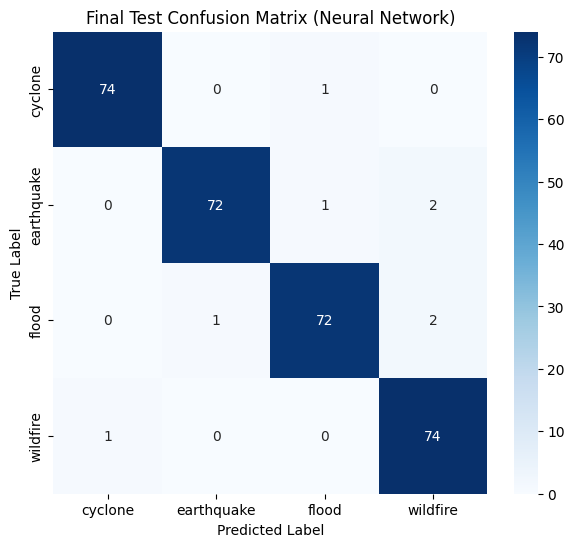

In [25]:
# ---------------------------------------------------------------
# Cell 22: Final Test Evaluation (Neural Network)
# ---------------------------------------------------------------
# Performs a comprehensive evaluation of the trained Neural Network
# on the unseen test dataset to assess final generalisation performance.

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# ---------------------------------------------------------------
# Sanity check: confirm a trained Keras model is loaded
# ---------------------------------------------------------------
print(type(model))  # Expected: tensorflow.keras Model

# ---------------------------------------------------------------
# Generate predictions on the test set
# ---------------------------------------------------------------
# Model outputs class probabilities via softmax
y_test_pred = model.predict(X_test_scaled)

# Convert probabilities to discrete class labels
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# ---------------------------------------------------------------
# Compute overall test accuracy
# ---------------------------------------------------------------
test_acc = accuracy_score(y_test_enc, y_test_pred_classes)
print(f"Final Test Accuracy: {test_acc:.4f}")

# ---------------------------------------------------------------
# Detailed classification metrics per class
# ---------------------------------------------------------------
# Includes precision, recall, F1-score and support
print("\n=== Final Test Classification Report ===")
print(classification_report(
    y_test_enc,
    y_test_pred_classes,
    target_names=class_names,
    digits=4
))

# ---------------------------------------------------------------
# Confusion matrix analysis
# ---------------------------------------------------------------
# Provides insight into class-wise misclassification patterns
cm = confusion_matrix(y_test_enc, y_test_pred_classes)

plt.figure(figsize=(7, 6))
sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=class_names,
    yticklabels=class_names
)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Final Test Confusion Matrix (Neural Network)")
plt.show()


In [26]:
# ---------------------------------------------------------------
# Cell 23: Model Comparison (SVM vs XGBoost vs Neural Network)
# ---------------------------------------------------------------
# Quantitatively compares classical ML and deep learning models
# using final test-set performance to support evidence-based
# model selection.

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import f1_score, accuracy_score

# ---------------------------------------------------------------
# Support Vector Machine (SVM) evaluation
# ---------------------------------------------------------------
# Uses the optimised SVM obtained via GridSearchCV
svm_test_pred = best_svc.predict(X_test_scaled)
svm_test_acc  = accuracy_score(y_test_enc, svm_test_pred)
svm_test_f1   = f1_score(y_test_enc, svm_test_pred, average='macro')

# ---------------------------------------------------------------
# XGBoost evaluation (optional dependency)
# ---------------------------------------------------------------
# Wrapped in try–except to ensure reproducibility when XGBoost
# is unavailable in the execution environment
try:
    xgb_test_pred = best_xgb.predict(X_test_scaled)
    xgb_test_acc  = accuracy_score(y_test_enc, xgb_test_pred)
    xgb_test_f1   = f1_score(y_test_enc, xgb_test_pred, average='macro')
except Exception:
    xgb_test_acc, xgb_test_f1 = None, None

# ---------------------------------------------------------------
# Neural Network evaluation
# ---------------------------------------------------------------
# Converts softmax probabilities into discrete class predictions
nn_test_probs = model.predict(X_test_scaled)
nn_test_pred  = nn_test_probs.argmax(axis=1)

nn_test_acc = accuracy_score(y_test_enc, nn_test_pred)
nn_test_f1  = f1_score(y_test_enc, nn_test_pred, average='macro')

# ---------------------------------------------------------------
# Aggregate results into a comparison table
# ---------------------------------------------------------------
# Macro F1-score is prioritised to account for potential
# class imbalance across disaster categories
comparison_df = pd.DataFrame({
    "Model": ["SVM", "XGBoost", "Neural Network"],
    "Test Accuracy": [svm_test_acc, xgb_test_acc, nn_test_acc],
    "Macro F1-score": [svm_test_f1, xgb_test_f1, nn_test_f1]
})

comparison_df


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


,Model,Test Accuracy,Macro F1-score
0,SVM,0.980000,0.979955
1,XGBoost,0.956667,0.956787
2,Neural Network,0.973333,0.973351


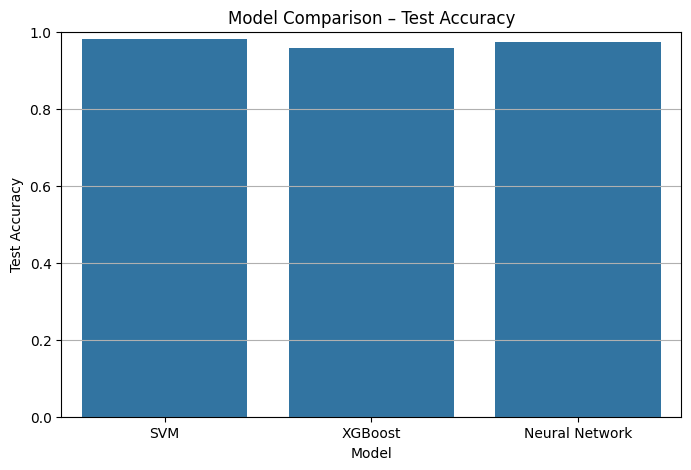

In [27]:
# ---------------------------------------------------------------
# Cell 24: Visual Comparison of Model Test Accuracy
# ---------------------------------------------------------------
# Provides a clear visual comparison of final test accuracy
# across all evaluated models to support interpretability
# and evidence-based performance analysis.

plt.figure(figsize=(8, 5))

# Bar chart showing test accuracy for each model
sns.barplot(
    data=comparison_df,
    x="Model",
    y="Test Accuracy"
)

# Constrain y-axis to valid accuracy range
plt.ylim(0, 1)

# Plot labelling for academic presentation
plt.title("Model Comparison – Test Accuracy")
plt.grid(axis='y')

# Render figure
plt.show()


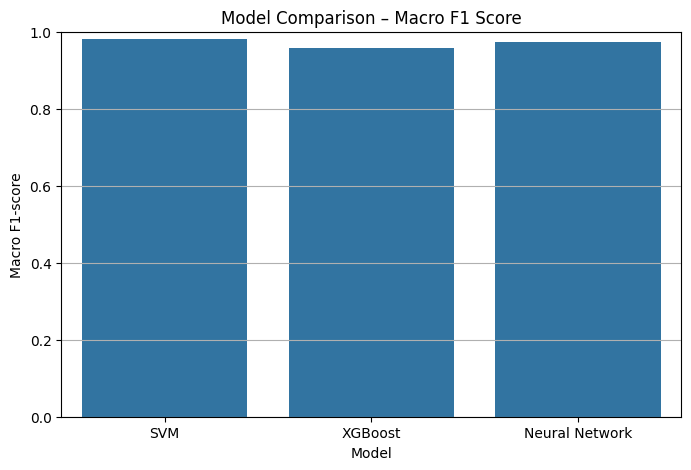

In [28]:
# ---------------------------------------------------------------
# Cell 25: Visual Comparison of Model Macro F1-Score
# ---------------------------------------------------------------
# Visualises macro-averaged F1-scores to compare balanced
# classification performance across models, particularly
# under class imbalance conditions.

plt.figure(figsize=(8, 5))

# Bar chart comparing macro F1-score for each trained model
sns.barplot(
    data=comparison_df,
    x="Model",
    y="Macro F1-score"
)

# Limit y-axis to valid F1-score range
plt.ylim(0, 1)

# Descriptive title for academic reporting
plt.title("Model Comparison – Macro F1 Score")

# Horizontal gridlines improve readability
plt.grid(axis='y')

# Display the plot
plt.show()


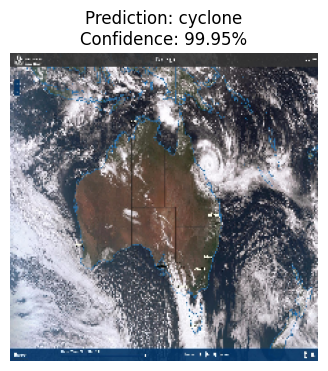

('cyclone', np.float32(99.9489))

In [29]:
# ---------------------------------------------------------------
# Cell 26: Single Image Prediction Demo (Neural Network)
# ---------------------------------------------------------------
# Demonstrates end-to-end inference on a single unseen image
# using the hybrid MobileNetV2 + Neural Network architecture.
# This cell validates real-world usability of the prototype.

import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image as kimage
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

# ---------------------------------------------------------------
# Path to a sample test image for qualitative evaluation
# ---------------------------------------------------------------
IMG_PATH = r"D:\DisasterModel\test\cyclone\526.jpg"


def predict_single_image(img_path):
    """
    Performs preprocessing, feature extraction, classification,
    and visualisation for a single input image.

    Args:
        img_path (str): Path to the input image.

    Returns:
        tuple: (predicted_class, confidence_percentage)
    """

    # -----------------------------------------------------------
    # Load and preprocess image for MobileNetV2
    # -----------------------------------------------------------
    img = kimage.load_img(img_path, target_size=IMG_SIZE)
    img_array = kimage.img_to_array(img)
    img_array_exp = np.expand_dims(img_array, axis=0)
    img_array_exp = preprocess_input(img_array_exp)

    # -----------------------------------------------------------
    # Extract deep feature embedding using frozen CNN backbone
    # -----------------------------------------------------------
    embedding = base_model.predict(img_array_exp, verbose=0)
    embedding = embedding.reshape(1, -1)

    # -----------------------------------------------------------
    # Apply feature scaling consistent with training pipeline
    # -----------------------------------------------------------
    embedding_scaled = scaler.transform(embedding)

    # -----------------------------------------------------------
    # Neural Network inference (softmax probabilities)
    # -----------------------------------------------------------
    probs = model.predict(embedding_scaled, verbose=0)[0]
    pred_class_idx = np.argmax(probs)
    pred_class = class_names[pred_class_idx]
    confidence = probs[pred_class_idx] * 100

    # -----------------------------------------------------------
    # Visualise prediction result for interpretability
    # -----------------------------------------------------------
    plt.figure(figsize=(4, 4))
    plt.imshow(img)
    plt.axis('off')
    plt.title(
        f"Prediction: {pred_class}\n"
        f"Confidence: {confidence:.2f}%"
    )
    plt.show()

    return pred_class, confidence


# ---------------------------------------------------------------
# Execute single-image prediction
# ---------------------------------------------------------------
predict_single_image(IMG_PATH)


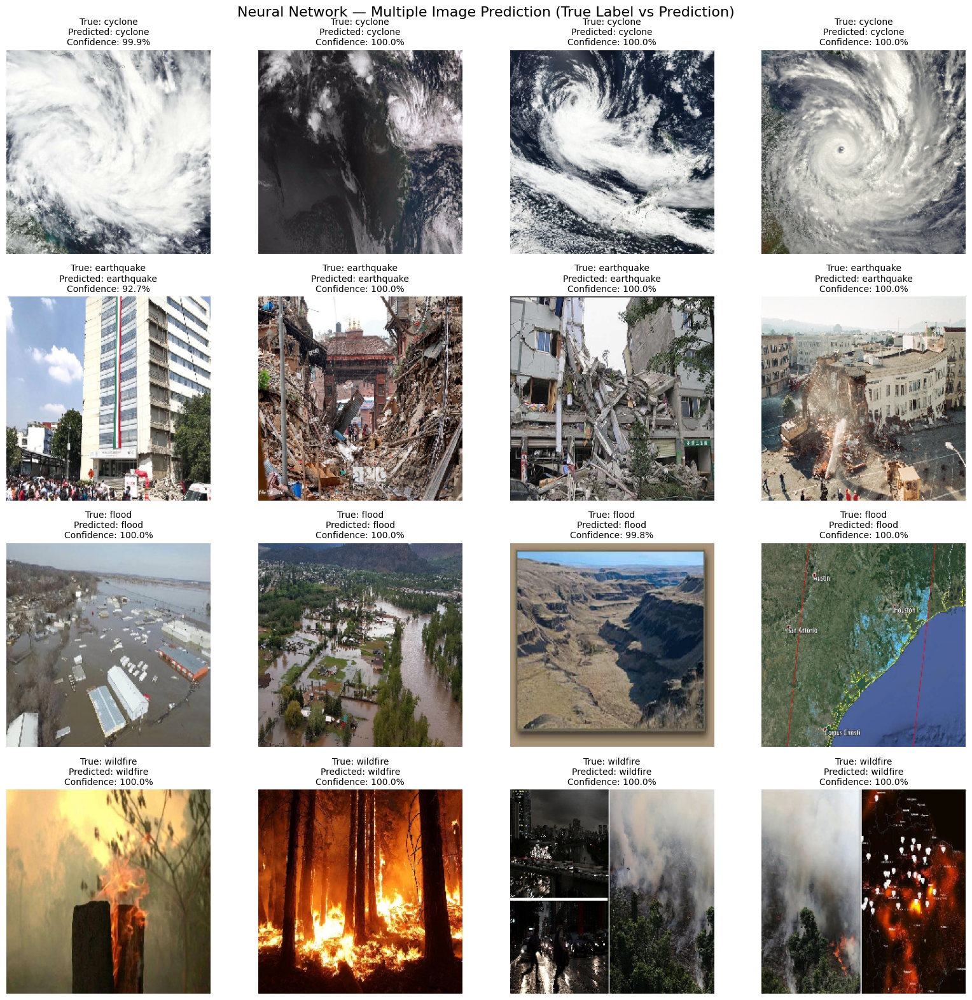

In [30]:
# ---------------------------------------------------------------
# Cell 27: Multiple Image Prediction (Neural Network)
# ---------------------------------------------------------------
# Performs structured qualitative evaluation by testing multiple
# unseen images per class in a single grid layout. The output
# explicitly compares true labels against predicted labels with
# confidence scores to assess model reliability and generalisation.

import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image as kimage
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

# ---------------------------------------------------------------
# Configuration: test directory and visualisation layout
# ---------------------------------------------------------------
TEST_DIR = r"D:\DisasterModel\test"
IMAGES_PER_CLASS = 4        # Number of test images shown per class
ROWS = len(class_names)     # One row per disaster class

# Initialise large figure to maintain clarity across classes
plt.figure(figsize=(16, 4 * ROWS))
plot_idx = 1

# ---------------------------------------------------------------
# Iterate through each class to ensure balanced evaluation
# ---------------------------------------------------------------
for true_label in class_names:   # Fixed order for consistent reporting
    class_dir = os.path.join(TEST_DIR, true_label)

    # Skip class if directory is missing
    if not os.path.isdir(class_dir):
        continue

    # Select a limited number of images per class
    img_files = os.listdir(class_dir)[:IMAGES_PER_CLASS]

    for img_name in img_files:
        img_path = os.path.join(class_dir, img_name)

        # -------------------------------------------------------
        # Load and preprocess image for MobileNetV2 backbone
        # -------------------------------------------------------
        img = kimage.load_img(img_path, target_size=IMG_SIZE)
        img_array = kimage.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array = preprocess_input(img_array)

        # -------------------------------------------------------
        # Extract deep feature embedding (CNN feature space)
        # -------------------------------------------------------
        embedding = base_model.predict(img_array, verbose=0).reshape(1, -1)
        embedding_scaled = scaler.transform(embedding)

        # -------------------------------------------------------
        # Neural Network inference (softmax-based prediction)
        # -------------------------------------------------------
        probs = model.predict(embedding_scaled, verbose=0)[0]
        pred_idx = np.argmax(probs)
        pred_label = class_names[pred_idx]
        confidence = probs[pred_idx] * 100

        # -------------------------------------------------------
        # Visualise prediction with true vs predicted label
        # -------------------------------------------------------
        plt.subplot(ROWS, IMAGES_PER_CLASS, plot_idx)
        plt.imshow(img)
        plt.axis("off")
        plt.title(
            f"True: {true_label}\n"
            f"Predicted: {pred_label}\n"
            f"Confidence: {confidence:.1f}%",
            fontsize=10
        )

        plot_idx += 1

# ---------------------------------------------------------------
# Overall figure title and layout optimisation
# ---------------------------------------------------------------
plt.suptitle(
    "Neural Network — Multiple Image Prediction (True Label vs Prediction)",
    fontsize=16
)
plt.tight_layout()
plt.show()


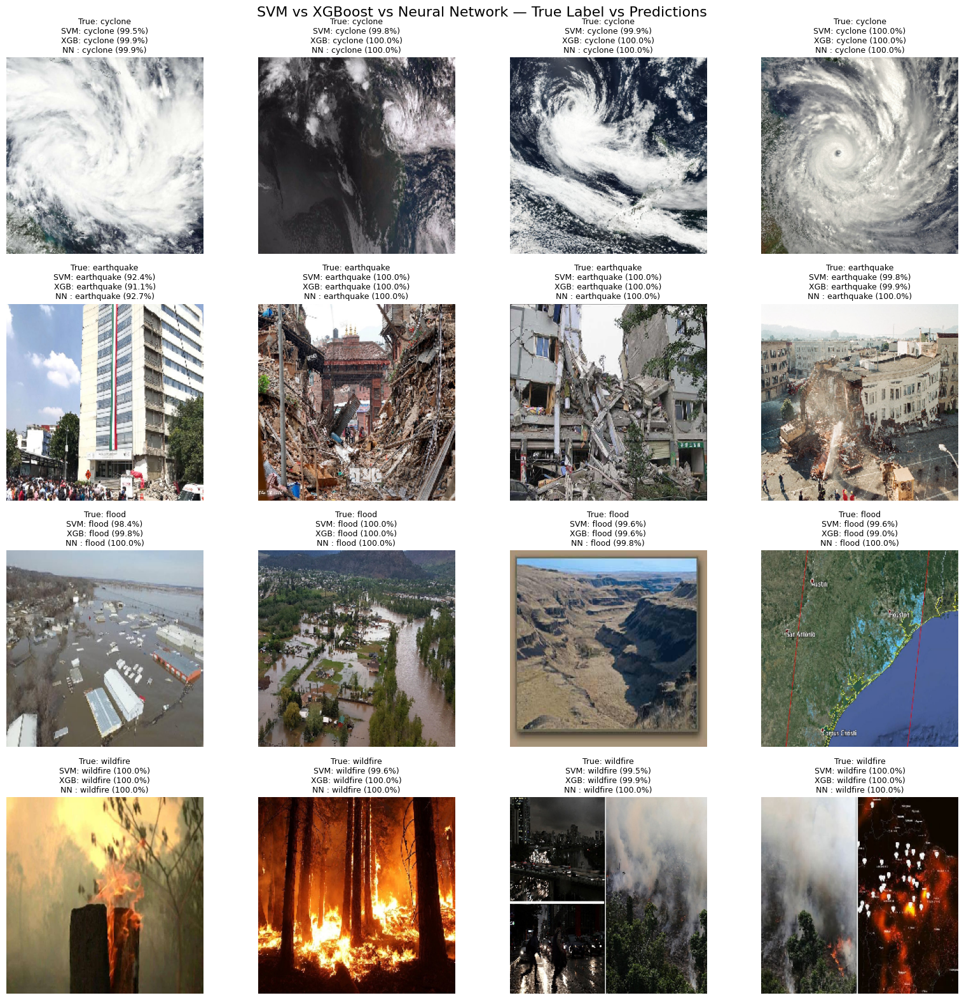

In [31]:
# ---------------------------------------------------------------
# Cell 28: SVM vs XGBoost vs Neural Network
# ---------------------------------------------------------------
# Performs a side-by-side qualitative comparison of three different
# classifiers (SVM, XGBoost, and Neural Network) using identical
# deep feature embeddings. The visualisation highlights true labels,
# predicted labels, and confidence scores to assess consistency,
# robustness, and model agreement on unseen test images.

import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image as kimage
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

# ---------------------------------------------------------------
# Configuration for test evaluation and grid layout
# ---------------------------------------------------------------
TEST_DIR = r"D:\DisasterModel\test"
IMAGES_PER_CLASS = 4          # Number of images evaluated per class
ROWS = len(class_names)       # One row per disaster category

# Initialise figure to ensure clear multi-model comparison
plt.figure(figsize=(16, 4 * ROWS))
plot_idx = 1

# ---------------------------------------------------------------
# Iterate through each disaster class in a fixed order
# ---------------------------------------------------------------
# Fixed ordering ensures consistent visual alignment across runs
for true_label in class_names:
    class_dir = os.path.join(TEST_DIR, true_label)

    # Skip class if directory is unavailable
    if not os.path.isdir(class_dir):
        continue

    # Select a limited, representative subset of images per class
    img_files = os.listdir(class_dir)[:IMAGES_PER_CLASS]

    for img_name in img_files:
        img_path = os.path.join(class_dir, img_name)

        # -------------------------------------------------------
        # Load and preprocess image for CNN-based feature extraction
        # -------------------------------------------------------
        img = kimage.load_img(img_path, target_size=IMG_SIZE)
        img_array = kimage.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array = preprocess_input(img_array)

        # -------------------------------------------------------
        # Extract and scale deep feature embedding
        # -------------------------------------------------------
        # MobileNetV2 acts as a frozen backbone for representation learning
        embedding = base_model.predict(img_array, verbose=0).reshape(1, -1)
        embedding_scaled = scaler.transform(embedding)

        # -------------------------------------------------------
        # Support Vector Machine prediction
        # -------------------------------------------------------
        svm_probs = best_svc.predict_proba(embedding_scaled)[0]
        svm_idx = np.argmax(svm_probs)
        svm_label = class_names[svm_idx]
        svm_conf = svm_probs[svm_idx] * 100

        # -------------------------------------------------------
        # XGBoost prediction
        # -------------------------------------------------------
        xgb_probs = best_xgb.predict_proba(embedding_scaled)[0]
        xgb_idx = np.argmax(xgb_probs)
        xgb_label = class_names[xgb_idx]
        xgb_conf = xgb_probs[xgb_idx] * 100

        # -------------------------------------------------------
        # Neural Network prediction
        # -------------------------------------------------------
        nn_probs = model.predict(embedding_scaled, verbose=0)[0]
        nn_idx = np.argmax(nn_probs)
        nn_label = class_names[nn_idx]
        nn_conf = nn_probs[nn_idx] * 100

        # -------------------------------------------------------
        # Visualise true label vs predictions from all models
        # -------------------------------------------------------
        plt.subplot(ROWS, IMAGES_PER_CLASS, plot_idx)
        plt.imshow(img)
        plt.axis("off")
        plt.title(
            f"True: {true_label}\n"
            f"SVM: {svm_label} ({svm_conf:.1f}%)\n"
            f"XGB: {xgb_label} ({xgb_conf:.1f}%)\n"
            f"NN : {nn_label} ({nn_conf:.1f}%)",
            fontsize=9
        )

        plot_idx += 1

# ---------------------------------------------------------------
# Global figure annotation and layout adjustment
# ---------------------------------------------------------------
plt.suptitle(
    "SVM vs XGBoost vs Neural Network — True Label vs Predictions",
    fontsize=16
)
plt.tight_layout()
plt.show()
